In [ ]:
!unzip test.tsv.zip
!unzip train.tsv.zip
!unzip reviews.txv.zip

Archive:  test.tsv.zip
  inflating: test.tsv                
Archive:  train.tsv.zip
  inflating: train.tsv               
Archive:  reviews.txv.zip
  inflating: reviews.tsv             


In [ ]:
import pandas as pd

df_train = pd.read_csv('train.tsv', sep='\t')
df_test = pd.read_csv('test.tsv', sep='\t')
reviews = pd.read_csv('reviews.tsv', sep='\t')

In [ ]:
pd.set_option('display.float_format', '{:.5f}'.format)

# Preprocessing

In [ ]:
df_train.head()

,id,name,coordinates,category,address,target,traffic_300m,homes_300m,works_300m,female_300m,...,doramas_1000m,computer_components_1000m,humor_1000m,car_market_1000m,no_higher_education_1000m,goods_for_moms_and_babies_1000m,age_25-34_1000m,male_1000m,phone_repair_1000m,mean_income_1000m
0,1365,"Городская поликлиника № 109, филиал № 2","[37.735049, 55.719667]",health,"Грайвороновская ул., 18, корп. 1, Москва",4.10000,75429,16113.58247,15756.24644,51316.00000,...,4668.00000,7718.00000,33389.00000,18306.00000,426241.00000,415.00000,380148.00000,619550.00000,2781.00000,113767.38725
1,8230,Wellness Club Nebo,"[37.537083, 55.749511]",swimming_pool,"Пресненская наб., 12, Москва",3.60000,246535,8578.45874,31315.67279,192547.00000,...,3431.00000,11463.00000,61107.00000,23662.00000,488685.00000,356.00000,436721.00000,764733.00000,4264.00000,122931.92126
2,29071,Первый МГМУ имени Сеченова,"[37.576087, 55.73734]",higher_education_institutions,"ул. Плющиха, 57, стр. 1, Москва",3.50000,83490,12650.49240,12490.09678,56045.00000,...,4674.00000,14899.00000,78547.00000,31585.00000,866939.00000,520.00000,712973.00000,1143924.00000,6518.00000,117643.54994
3,22591,your SPAce,"[37.458876, 55.776851]",cosmetology,"просп. Маршала Жукова, 59, Москва",4.00000,43421,6413.27922,4963.05805,28705.00000,...,1523.00000,3151.00000,16323.00000,7876.00000,187408.00000,264.00000,157896.00000,273576.00000,1346.00000,117420.00460
4,27621,СоюзЦветТорг,"[37.711734, 55.794372]",flower_delivery,"Преображенская площадь, 6, Москва",4.20000,155094,18638.41013,19868.19057,123492.00000,...,7292.00000,8559.00000,38895.00000,17573.00000,461113.00000,356.00000,390959.00000,625687.00000,3635.00000,114367.32577


In [ ]:
df_train = df_train[df_train['target'] > 0.9]

In [ ]:
reviews.head()

,id,text
0,43591,"Мармелад в целом неплохой, но цены завышены, м..."
1,43591,"Не нравится, что товар выложен открыто, слишко..."
2,43591,"Часто попадается сухой мармелад, дубовый впере..."
3,43591,"Персонал был одет в костюмы пиратов, а ассорти..."
4,43591,"Вкусный мармелад с широким ассортиментом форм,..."


In [ ]:
cat_cols = df_train.select_dtypes(include='object').columns.to_list()
nan_df = df_train.isna().sum() / len(df_train)
nan_df[nan_df > 0]

,0
address,0.00054


In [ ]:
df_train.shape

(37119, 286)

In [ ]:
from ast import literal_eval

def parse_cords(coord_str):
    coords = literal_eval(coord_str)
    return float(coords[0]), float(coords[1])

def create_cords_features(df):
    df['longitude'] = df['coordinates'].apply(lambda x: parse_cords(x)[0])
    df['latitude'] = df['coordinates'].apply(lambda x: parse_cords(x)[1])
    df = df.drop('coordinates', axis=1)
    return df

df_test = create_cords_features(df_test)
df_train = create_cords_features(df_train)

In [ ]:
category_count = df_train.groupby('category')['target'].agg(['mean', 'count'])\
.sort_values(by='count', ascending=False).reset_index()
category_count.tail(3)

,category,mean,count
37,swimming_pool,4.00021,486
38,restaurant,4.09386,472
39,library,3.82837,423


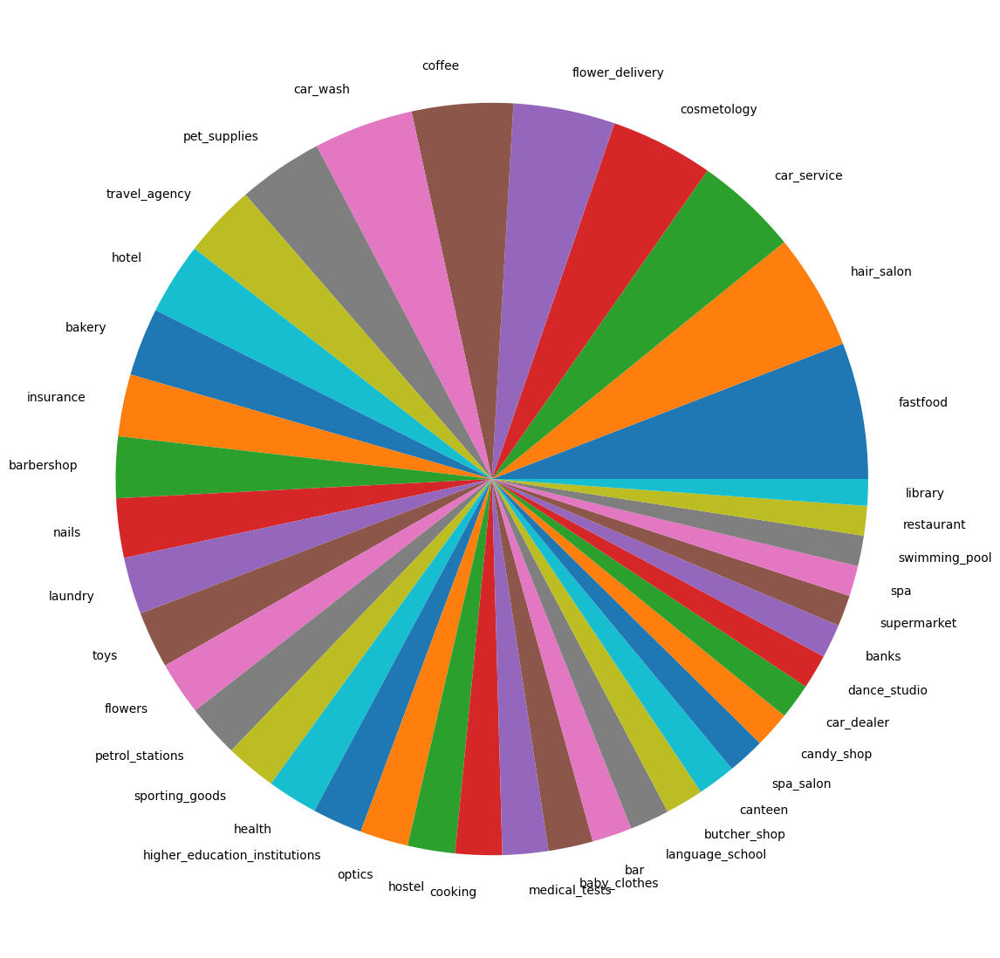

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=[14,14])
plt.pie(x=category_count['count'].values, labels=category_count['category'].to_list())
plt.savefig('category_pie.png')
plt.show()

<BarContainer object of 40 artists>

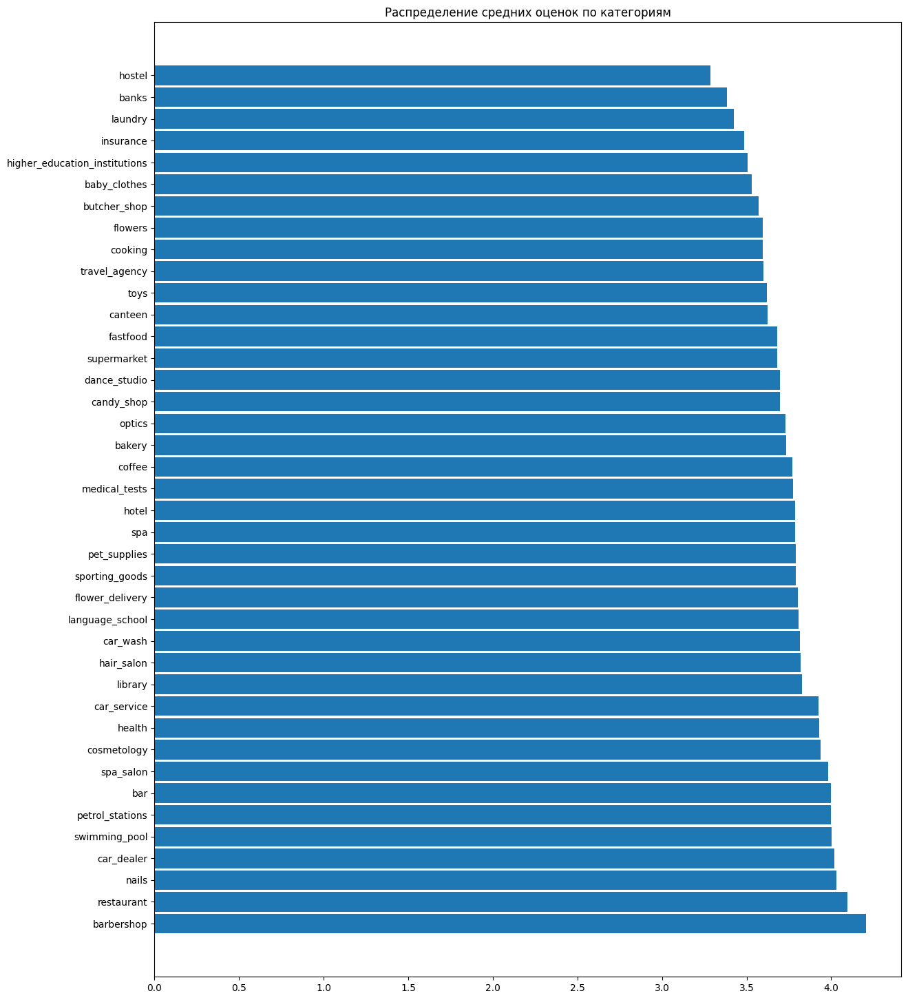

In [ ]:
category_count.sort_values(by='mean', ascending=False, inplace=True)

plt.figure(figsize=[14,18])
plt.title('Распределение средних оценок по категориям')
plt.barh(y=category_count['category'], width=category_count['mean'], height=0.9)

In [ ]:
df_train.head(3)

,id,name,category,address,target,traffic_300m,homes_300m,works_300m,female_300m,train_ticket_order_300m,...,humor_1000m,car_market_1000m,no_higher_education_1000m,goods_for_moms_and_babies_1000m,age_25-34_1000m,male_1000m,phone_repair_1000m,mean_income_1000m,longitude,latitude
0,1365,"Городская поликлиника № 109, филиал № 2",health,"Грайвороновская ул., 18, корп. 1, Москва",4.10000,75429,16113.58247,15756.24644,51316.00000,734.00000,...,33389.00000,18306.00000,426241.00000,415.00000,380148.00000,619550.00000,2781.00000,113767.38725,37.73505,55.71967
1,8230,Wellness Club Nebo,swimming_pool,"Пресненская наб., 12, Москва",3.60000,246535,8578.45874,31315.67279,192547.00000,4701.00000,...,61107.00000,23662.00000,488685.00000,356.00000,436721.00000,764733.00000,4264.00000,122931.92126,37.53708,55.74951
2,29071,Первый МГМУ имени Сеченова,higher_education_institutions,"ул. Плющиха, 57, стр. 1, Москва",3.50000,83490,12650.49240,12490.09678,56045.00000,1204.00000,...,78547.00000,31585.00000,866939.00000,520.00000,712973.00000,1143924.00000,6518.00000,117643.54994,37.57609,55.73734


In [ ]:
!pip install contextily -q
!pip install h3 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.1 MB/s eta 0:00:00


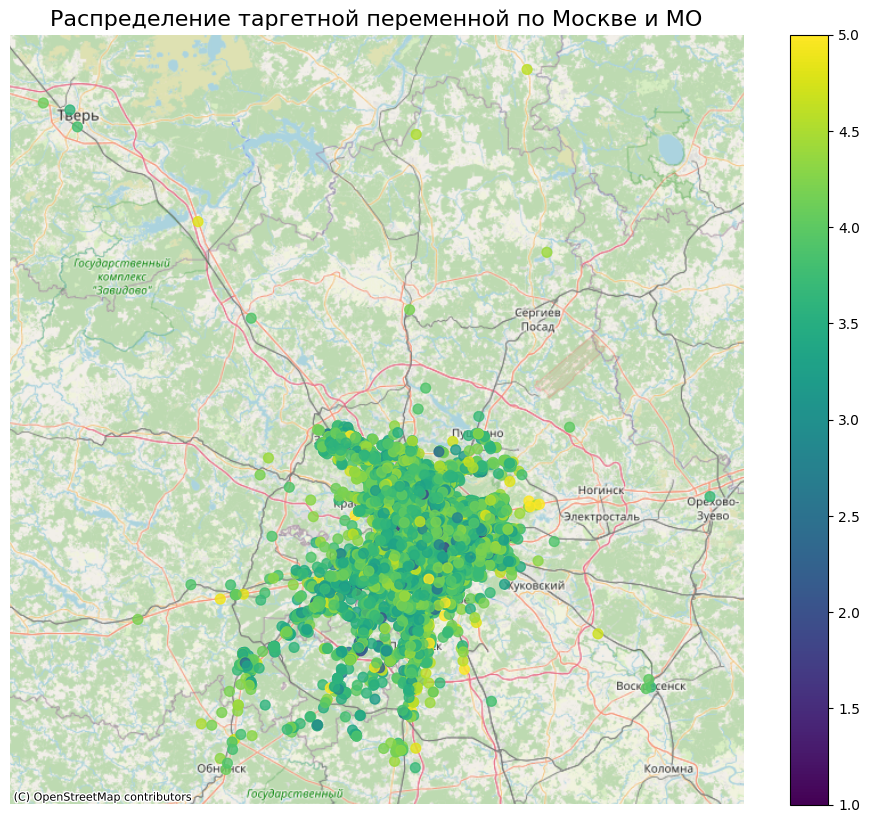

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as ctx

# 1. Создаём геометрию из координат
geometry = [Point(xy) for xy in zip(df_train['longitude'], df_train['latitude'])]  # ВНИМАНИЕ: сначала lon, потом lat!

# 2. Создаём GeoDataFrame
gdf = gpd.GeoDataFrame(df_train, geometry=geometry)

# 3. Устанавливаем CRS (систему координат): WGS84 = EPSG:4326
gdf.set_crs(epsg=4326, inplace=True)

# 4. Преобразуем в проекцию, подходящую для Москвы (Web Mercator для contextily)
gdf_web_mercator = gdf.to_crs(epsg=3857)

# 5. Строим карту
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Строим точки, цвет по target
gdf_web_mercator.plot(
    column='target',
    cmap='viridis',
    legend=True,
    markersize=50,
    alpha=0.8,
    ax=ax
)

# Добавляем подложку карты (OpenStreetMap)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Убираем оси
ax.set_axis_off()

# Заголовок
plt.title('Распределение таргетной переменной по Москве и МО', fontsize=16)

# Показываем
plt.show()

Выбрасываем Тверь

In [ ]:
# Удаляем точки, похожие на Тверь
df_train = df_train[
    ~(
        (df_train['latitude'] > 56.25) |   # широта выше Москвы
        (df_train['longitude'] > df_test['longitude'].max())    # долгота западнее Москвы
    )
]

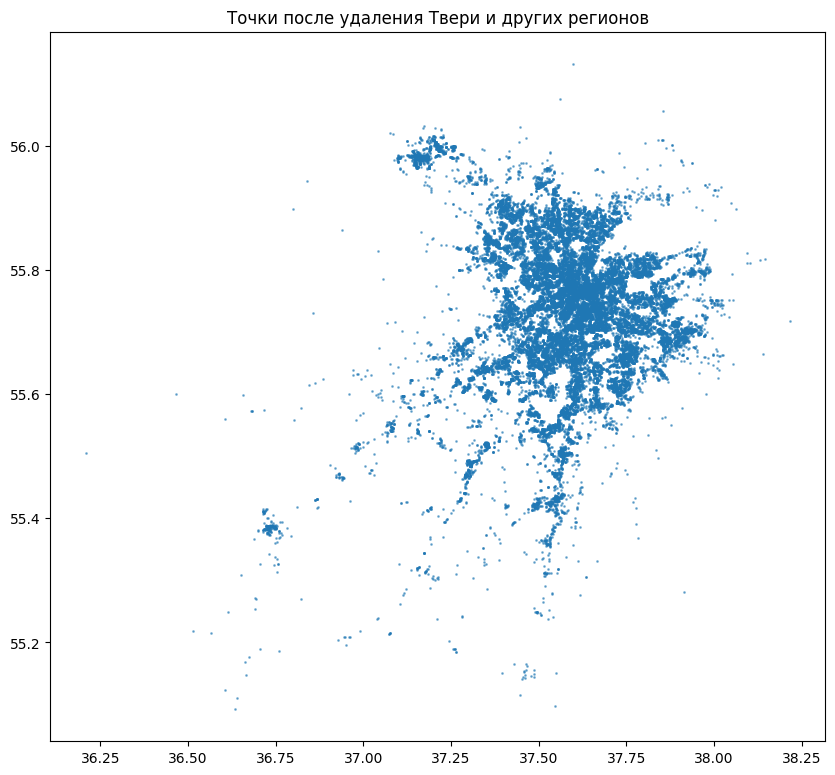

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

gdf = gpd.GeoDataFrame(
    df_train,
    geometry=[Point(xy) for xy in zip(df_train['longitude'], df_train['latitude'])],
    crs='EPSG:4326'
)
gdf.plot(figsize=(10, 10), markersize=1, alpha=0.5)
plt.title("Точки после удаления Твери и других регионов")
plt.show()

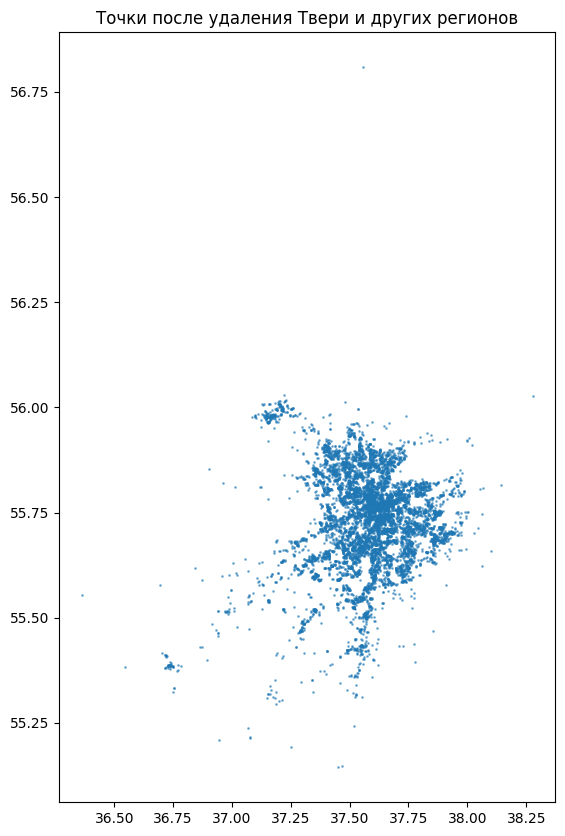

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

gdf = gpd.GeoDataFrame(
    df_test,
    geometry=[Point(xy) for xy in zip(df_test['longitude'], df_test['latitude'])],
    crs='EPSG:4326'
)
gdf.plot(figsize=(10, 10), markersize=1, alpha=0.5)
plt.title("Точки после удаления Твери и других регионов")
plt.show()

In [ ]:
df_test['longitude'].max()

38.278272

Распределение теста

✅ Всего точек для отображения: 9276


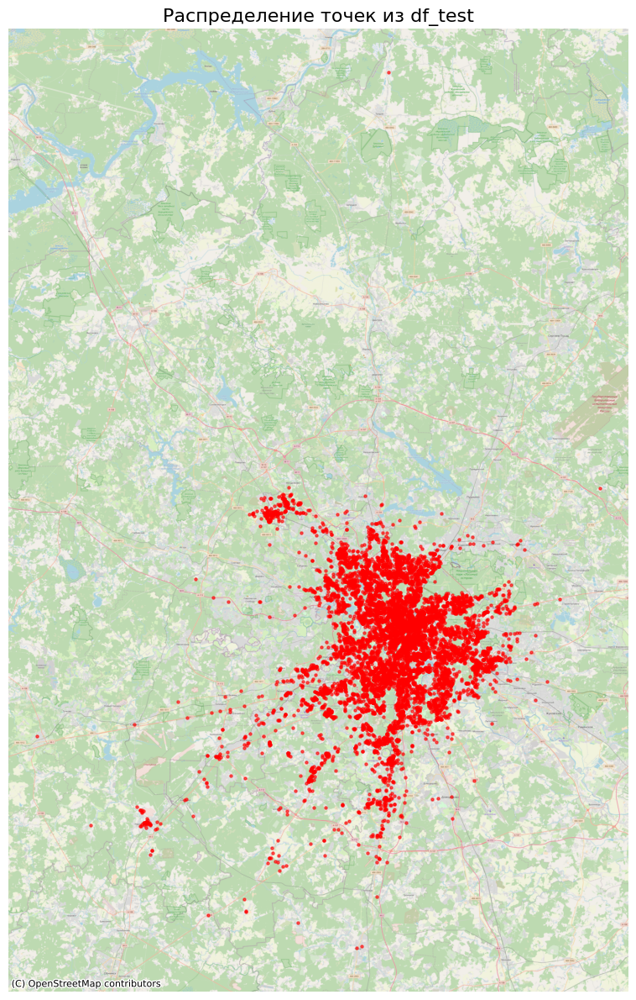

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# 1. Подготовка данных
df = df_test[['longitude', 'latitude']].copy()
df = df.dropna(subset=['longitude', 'latitude'])

# Приведём к числу (на случай строк)
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df = df.dropna()

# # Фильтр по Москве и ближайшему Подмосковью (опционально, но рекомендуется)
# df = df[
#     (55.0 <= df['latitude']) & (df['latitude'] <= 56.2) &
#     (36.5 <= df['longitude']) & (df['longitude'] <= 38.5)
# ]

print(f"✅ Всего точек для отображения: {len(df)}")

if len(df) == 0:
    raise ValueError("Нет валидных координат в пределах региона!")

# 2. Создаём геометрию
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

# 3. Преобразуем в проекцию Web Mercator для подложки
gdf = gdf.to_crs('EPSG:3857')

# 4. Визуализация
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

# Рисуем точки (все одного цвета, например, чёрные или синие)
gdf.plot(
    ax=ax,
    color='red',          # или 'blue', 'black' и т.д.
    markersize=5,         # размер точки
    alpha=0.6             # прозрачность (чтобы видеть скопления)
)

# Добавляем подложку карты
try:
    ctx.add_basemap(ax, zoom=11, source=ctx.providers.OpenStreetMap.Mapnik)
except Exception as e:
    print("⚠️ Подложка не загружена:", e)
    print("Карта отображается без фона.")

ax.set_axis_off()
plt.title('Распределение точек из df_test', fontsize=16)
plt.tight_layout()
plt.show()

✅ Всего точек для отображения: 9274


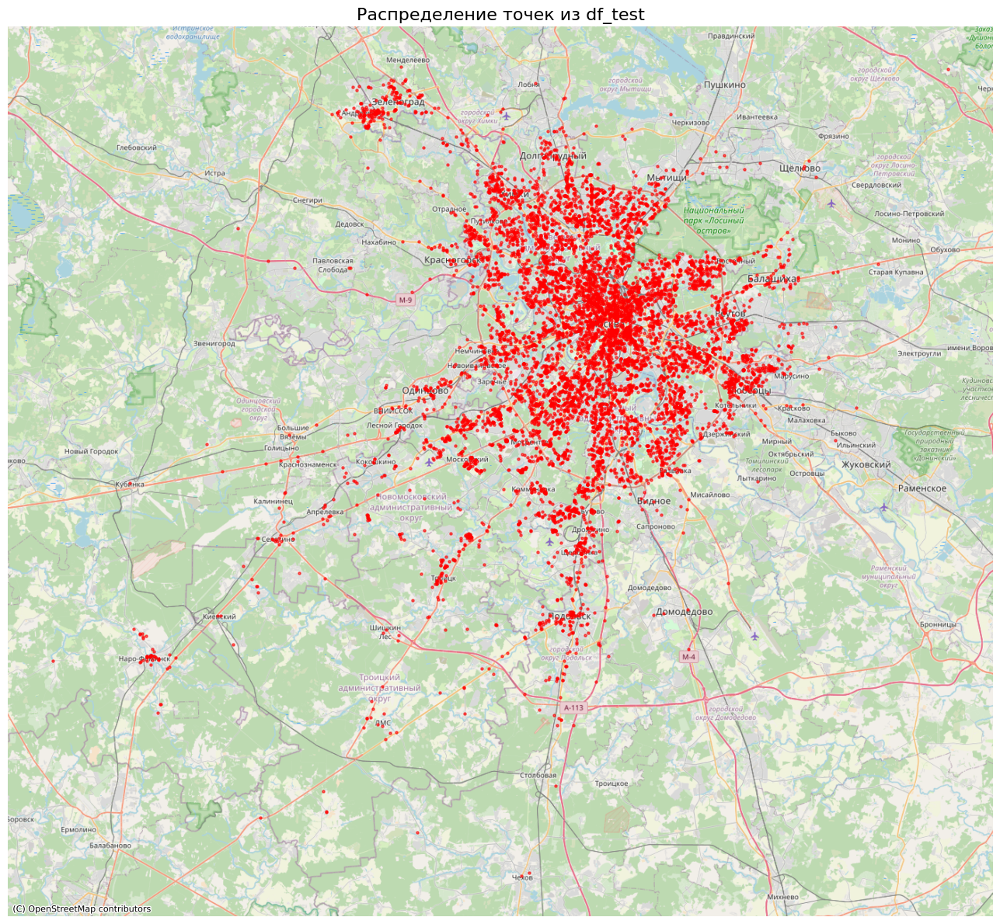

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# 1. Подготовка данных
df = df_test[['longitude', 'latitude']].copy()
df = df.dropna(subset=['longitude', 'latitude'])

# Приведём к числу (на случай строк)
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df = df.dropna()

# Фильтр по Москве и ближайшему Подмосковью (опционально, но рекомендуется)
df = df[
    (55.0 <= df['latitude']) & (df['latitude'] <= 56.2) &
    (36.5 <= df['longitude']) & (df['longitude'] <= 38.5)
]

print(f"✅ Всего точек для отображения: {len(df)}")

if len(df) == 0:
    raise ValueError("Нет валидных координат в пределах региона!")

# 2. Создаём геометрию
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

# 3. Преобразуем в проекцию Web Mercator для подложки
gdf = gdf.to_crs('EPSG:3857')

# 4. Визуализация
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

# Рисуем точки (все одного цвета, например, чёрные или синие)
gdf.plot(
    ax=ax,
    color='red',          # или 'blue', 'black' и т.д.
    markersize=5,         # размер точки
    alpha=0.6             # прозрачность (чтобы видеть скопления)
)

# Добавляем подложку карты
try:
    ctx.add_basemap(ax, zoom=10, source=ctx.providers.OpenStreetMap.Mapnik)
except Exception as e:
    print("⚠️ Подложка не загружена:", e)
    print("Карта отображается без фона.")

ax.set_axis_off()
plt.title('Распределение точек из df_test', fontsize=16)
plt.tight_layout()
plt.show()

✅ Всего точек для отображения: 30248


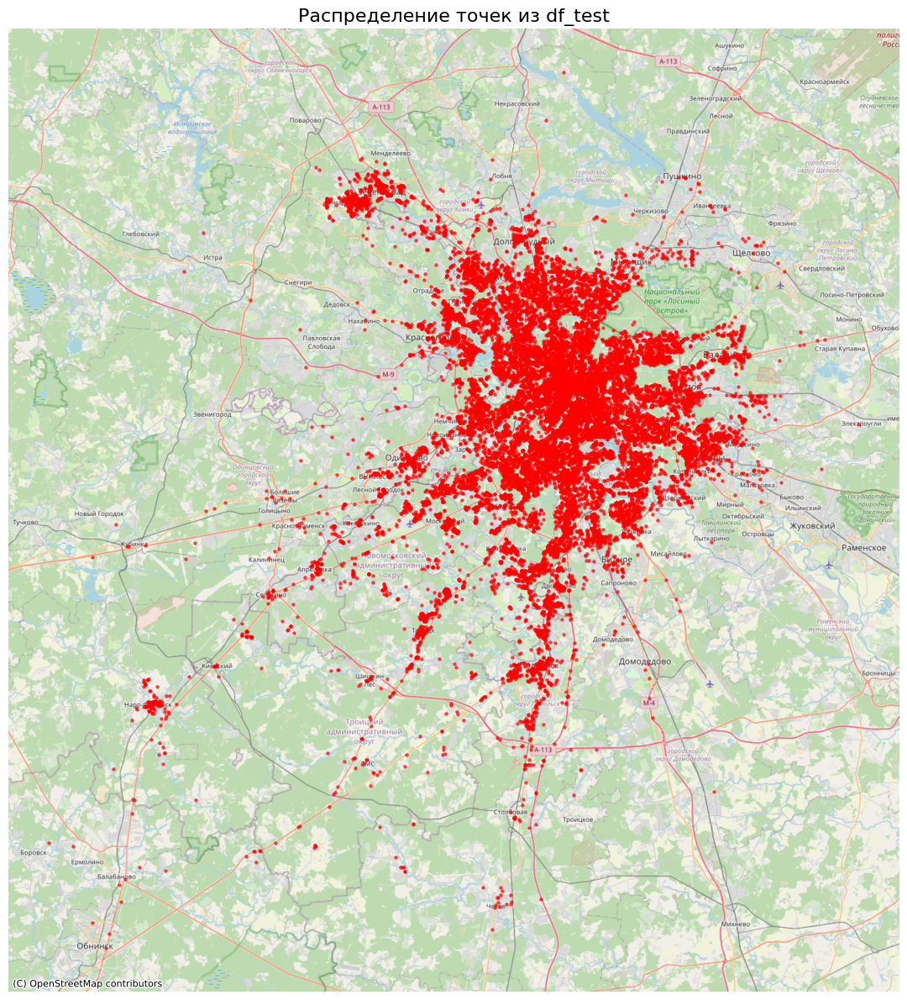

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# 1. Подготовка данных
df = df_train[['longitude', 'latitude']].copy()
df = df.dropna(subset=['longitude', 'latitude'])

# Приведём к числу (на случай строк)
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df = df.dropna()

# Фильтр по Москве и ближайшему Подмосковью (опционально, но рекомендуется)
df = df[
    (55.0 <= df['latitude']) & (df['latitude'] <= 56.2) &
    (36.5 <= df['longitude']) & (df['longitude'] <= 38.5)
]

print(f"✅ Всего точек для отображения: {len(df)}")

if len(df) == 0:
    raise ValueError("Нет валидных координат в пределах региона!")

# 2. Создаём геометрию
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

# 3. Преобразуем в проекцию Web Mercator для подложки
gdf = gdf.to_crs('EPSG:3857')

# 4. Визуализация
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

# Рисуем точки (все одного цвета, например, чёрные или синие)
gdf.plot(
    ax=ax,
    color='red',          # или 'blue', 'black' и т.д.
    markersize=5,         # размер точки
    alpha=0.6             # прозрачность (чтобы видеть скопления)
)

# Добавляем подложку карты
try:
    ctx.add_basemap(ax, zoom=10, source=ctx.providers.OpenStreetMap.Mapnik)
except Exception as e:
    print("⚠️ Подложка не загружена:", e)
    print("Карта отображается без фона.")

ax.set_axis_off()
plt.title('Распределение точек из df_test', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
reviews['text_len'] = reviews['text'].apply(lambda x: len(x))
reviews.head(3)

,id,text,text_len
0,43591,"Мармелад в целом неплохой, но цены завышены, м...",83
1,43591,"Не нравится, что товар выложен открыто, слишко...",99
2,43591,"Часто попадается сухой мармелад, дубовый впере...",84


In [ ]:
reviews_by_id = reviews.groupby('id')['text_len'].agg(['count', 'mean', 'std']).reset_index()\
.rename(columns={'count': 'reviews_count', 'mean': 'reviews_mean', 'std': 'reviews_std'})
reviews_by_id.head(3)

,id,reviews_count,reviews_mean,reviews_std
0,1,20,132.70000,75.40215
1,2,10,172.70000,78.26174
2,3,10,179.70000,110.97652


In [ ]:
df_train = df_train.merge(reviews_by_id, on='id')
df_test = df_test.merge(reviews_by_id, on='id', how='left')
df_test.head(3)

,id,name,category,address,traffic_300m,homes_300m,works_300m,female_300m,train_ticket_order_300m,mortgage_300m,...,goods_for_moms_and_babies_1000m,age_25-34_1000m,male_1000m,phone_repair_1000m,mean_income_1000m,longitude,latitude,reviews_count,reviews_mean,reviews_std
0,21472,Счастье,candy_shop,"Ходынский бул., 4, Москва",62672,4709.11052,4298.12530,38987.00000,961.00000,38.00000,...,221.00000,226914.00000,399582.00000,2255.00000,122883.79547,37.53333,55.79025,10.00000,150.00000,104.41477
1,9837,O'STIN,baby_clothes,"Носовихинское ш., 45, Реутов",110226,12987.98926,15235.25666,96081.00000,1346.00000,88.00000,...,102.00000,214465.00000,320022.00000,1801.00000,113878.73545,37.88683,55.75163,10.00000,94.70000,70.59910
2,41791,Дровосек,barbershop,"Беломорская ул., 18А, корп. 2, Москва",81080,9575.24857,9463.32290,57147.00000,1506.00000,83.00000,...,305.00000,253803.00000,431408.00000,2426.00000,119179.25793,37.47442,55.86355,NaN,NaN,NaN


In [ ]:
print('Length of unique names:', df_train['id'].nunique())
print('Total length of train dataset:', len(df_train))

Length of unique names: 30250
Total length of train dataset: 30250


In [ ]:
id_per_name = df_train.groupby('name')['id'].count()
id_per_name[id_per_name > 1].sort_values(ascending=False).head(20)

,id
name,
Милти,271
Цветы,267
Химчистка Диана,236
Пятёрочка,187
Буханка,179
Вкусно — и точка,170
Четыре Лапы,165
Роснефть,162
РЕСО-Гарантия,161


In [ ]:
def category_dummies(df):
    category_dummies = pd.get_dummies(df['category'], prefix='category')
    df = pd.concat([df, category_dummies], axis=1)
    df.drop(columns='category', inplace=True)
    return df

df_train = category_dummies(df_train)
df_test = category_dummies(df_test)

In [ ]:
data_description = df_train.describe().T.reset_index()
data_description

,index,count,mean,std,min,25%,50%,75%,max
0,id,30250.00000,24968.95940,14602.58021,1.00000,12207.25000,24938.00000,37602.50000,50381.00000
1,target,30250.00000,3.76227,0.44211,1.00000,3.50000,3.80000,4.00000,5.00000
2,traffic_300m,30250.00000,99622.68516,75090.35131,0.00000,54937.75000,81260.00000,121840.00000,1755348.00000
3,homes_300m,30250.00000,12564.50754,7167.84395,0.00000,7152.72416,12286.05961,17612.30892,84642.79437
4,works_300m,30250.00000,13711.58233,8105.59603,0.00000,7441.92734,13101.83491,19218.33643,87843.64722
...,...,...,...,...,...,...,...,...,...
282,longitude,30250.00000,37.57702,0.17372,36.20835,37.49085,37.58592,37.67586,38.21749
283,latitude,30250.00000,55.73406,0.11633,55.09263,55.66605,55.74371,55.80785,56.13177
284,reviews_count,30250.00000,11.43524,4.38281,2.00000,10.00000,10.00000,10.00000,22.00000
285,reviews_mean,30250.00000,146.02946,47.11395,13.50000,112.33333,142.80000,176.90000,334.50000


In [ ]:
num_cols = df_train.drop(['target', 'id'], axis=1).select_dtypes(exclude='object').columns.to_list()

## TF-IDF + SVD

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

grouped = reviews.groupby('id')['text'].apply(lambda x: ' '.join(x)).reset_index()
grouped.columns = ['id', 'combined_text']

vectorizer = TfidfVectorizer()
X_tfidf = vectorizer.fit_transform(grouped['combined_text'])

n_components = 10
svd = TruncatedSVD(n_components=n_components, random_state=42)
X_lsa = svd.fit_transform(X_tfidf)

In [ ]:
lsa_df = pd.DataFrame(X_lsa, columns=[f'topic_{i+1}' for i in range(n_components)])
lsa_df.head()

,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10
0,0.27640,-0.04239,0.16839,0.00084,-0.04860,-0.19710,0.05988,0.11215,0.11683,-0.09111
1,0.22900,-0.04960,-0.04424,-0.08134,-0.06302,0.05357,-0.05028,-0.05539,-0.00729,0.01237
2,0.19791,0.04981,-0.01125,-0.06053,0.05183,0.01371,0.02254,0.05715,-0.00677,-0.01576
3,0.07965,-0.01836,-0.00399,-0.00790,-0.00885,0.00440,0.01362,-0.00039,-0.01535,-0.01633
4,0.10056,-0.01850,-0.01293,-0.02667,-0.01515,0.01969,0.01620,0.01416,0.02705,-0.01831


In [ ]:
result_df = pd.concat([grouped[['id']], lsa_df], axis=1)
result_df.head()

,id,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10
0,1,0.27640,-0.04239,0.16839,0.00084,-0.04860,-0.19710,0.05988,0.11215,0.11683,-0.09111
1,2,0.22900,-0.04960,-0.04424,-0.08134,-0.06302,0.05357,-0.05028,-0.05539,-0.00729,0.01237
2,3,0.19791,0.04981,-0.01125,-0.06053,0.05183,0.01371,0.02254,0.05715,-0.00677,-0.01576
3,4,0.07965,-0.01836,-0.00399,-0.00790,-0.00885,0.00440,0.01362,-0.00039,-0.01535,-0.01633
4,6,0.10056,-0.01850,-0.01293,-0.02667,-0.01515,0.01969,0.01620,0.01416,0.02705,-0.01831


In [ ]:
df_train = df_train.merge(result_df, on='id', how='left')
df_test = df_test.merge(result_df, on='id', how='left')

df_train = df_train.fillna(0)
df_test = df_test.fillna(0)

df_train.head()

,id,name,address,target,traffic_300m,homes_300m,works_300m,female_300m,train_ticket_order_300m,mortgage_300m,...,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9,topic_10
0,1365,"Городская поликлиника № 109, филиал № 2","Грайвороновская ул., 18, корп. 1, Москва",4.10000,75429,16113.58247,15756.24644,51316.00000,734.00000,35.00000,...,0.27995,-0.08292,-0.05866,-0.09938,-0.07535,0.07766,0.00969,-0.00448,-0.14220,0.01707
1,8230,Wellness Club Nebo,"Пресненская наб., 12, Москва",3.60000,246535,8578.45874,31315.67279,192547.00000,4701.00000,305.00000,...,0.20343,-0.03687,0.02178,0.00247,0.00098,-0.02474,0.10696,0.00779,0.01193,-0.03976
2,29071,Первый МГМУ имени Сеченова,"ул. Плющиха, 57, стр. 1, Москва",3.50000,83490,12650.49240,12490.09678,56045.00000,1204.00000,53.00000,...,0.13616,-0.01708,0.00730,-0.04249,-0.00327,0.00886,0.05258,-0.01047,-0.00997,-0.01242
3,22591,your SPAce,"просп. Маршала Жукова, 59, Москва",4.00000,43421,6413.27922,4963.05805,28705.00000,540.00000,42.00000,...,0.26004,-0.13342,-0.15615,0.11461,0.10627,-0.12549,-0.00376,-0.05853,-0.06462,0.05683
4,27621,СоюзЦветТорг,"Преображенская площадь, 6, Москва",4.20000,155094,18638.41013,19868.19057,123492.00000,2411.00000,95.00000,...,0.22165,0.28327,-0.04558,0.07638,-0.03494,-0.00438,0.01834,0.02568,0.03016,0.00380


In [ ]:
# df_train.drop(columns=lsa_df.columns.to_list(), inplace=True)
# df_test.drop(columns=lsa_df.columns.to_list(), inplace=True)

In [ ]:
def city_convertation(df):
    df['city_1'] = df['address'].str.split(',').str[-1].str.strip()
    df['city_2'] = df['address'].str.split(',').str[0].str.strip()

    valid_city_patterns = {
        'single_word': r'^[А-ЯЁ][а-яё]*$',
        'd_with_word': r'^д\.\s+[А-ЯЁ][а-яё]*$',
        'poselok': r'^пос[её]лок',
        'selo': r'^село\s+[А-ЯЁ][а-яё]*(\s+[А-ЯЁ][а-яё]*)*$',  # <-- добавлено
    }
    combined_pattern = '|'.join(f"({pattern})" for pattern in valid_city_patterns.values())
    mask = df['city_2'].str.contains(combined_pattern, case=True, regex=True, na=False)

    df['city_1'] = df['city_1'].where(~mask, df['city_2'])

    valid_city_patterns = {
    'poselok': r'пос[её]лок',  # поддерживает "поселок" и "посёлок"
    'selo': r'село\s+',
    'd_with_word': r'^д\.\s+[А-ЯЁ][а-яё]*$',  # оставляем как есть
    }

    # Создаём булевые колонки
    for col_name, pattern in valid_city_patterns.items():
        df[col_name] = df['city_1'].str.contains(pattern, case=True, regex=True, na=False)
    df.drop(columns=['city_2', 'address', 'name'], inplace=True)
    df['is_in_Moscow'] = (df['city_1'] == 'Москва').astype(int)
    return df

In [ ]:
df_train = city_convertation(df_train)
df_test = city_convertation(df_test)

/tmp/ipython-input-3079822997.py:12: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = df['city_2'].str.contains(combined_pattern, case=True, regex=True, na=False)
/tmp/ipython-input-3079822997.py:12: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = df['city_2'].str.contains(combined_pattern, case=True, regex=True, na=False)


In [ ]:
print(len(df_test.city_1.value_counts()))
print(len(df_train.city_1.value_counts()))

258
510


# Model Selection

In [ ]:
from sklearn.model_selection import train_test_split

X = df_train.copy()
X_test = df_test.copy()

X = X.drop(columns=['target', 'id', 'city_1'])
X_test = X_test.drop(columns=['id', 'city_1'])
y = df_train['target']

In [ ]:
X.head()

,traffic_300m,homes_300m,works_300m,female_300m,train_ticket_order_300m,mortgage_300m,recipes_300m,online_shops_300m,manga_300m,children_goods_300m,...,category_spa,category_spa_salon,category_sporting_goods,category_supermarket,category_swimming_pool,category_toys,category_travel_agency,poselok,selo,d_with_word
0,75429,16113.58247,15756.24644,51316.00000,734.00000,35.00000,4820.00000,10943.00000,120.00000,4566.00000,...,False,False,False,False,False,False,False,False,False,False
1,246535,8578.45874,31315.67279,192547.00000,4701.00000,305.00000,19354.00000,53112.00000,561.00000,21679.00000,...,False,False,False,False,True,False,False,False,False,False
2,83490,12650.49240,12490.09678,56045.00000,1204.00000,53.00000,5093.00000,12265.00000,108.00000,5495.00000,...,False,False,False,False,False,False,False,False,False,False
3,43421,6413.27922,4963.05805,28705.00000,540.00000,42.00000,2936.00000,7495.00000,70.00000,3067.00000,...,False,False,False,False,False,False,False,False,False,False
4,155094,18638.41013,19868.19057,123492.00000,2411.00000,95.00000,11066.00000,28705.00000,237.00000,11714.00000,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
from sklearn.decomposition import NMF

nmf = NMF(n_components=50, random_state=52)
X_nmf = nmf.fit_transform(X.drop(columns=['longitude', 'latitude']))

In [ ]:
X_test_nmf = nmf.transform(X_test.drop(columns=['longitude', 'latitude']))

/usr/local/lib/python3.12/dist-packages/sklearn/decomposition/_nmf.py:1742: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [ ]:
# После обучения NMF
components = nmf.components_  # shape: (n_components, n_features)

feature_names = X.drop(columns=['longitude', 'latitude']).columns
for i, comp in enumerate(components):
    top_features = [feature_names[j] for j in comp.argsort()[-10:][::-1]]
    print(f"Компонента {i}: {top_features}")

Компонента 0: ['employed_1000m', 'female_1000m', 'traffic_1000m', 'male_1000m', 'not_married_1000m', 'no_children_1000m', 'no_higher_education_1000m', 'higher_education_1000m', 'has_children_1000m', 'age_25-34_1000m']
Компонента 1: ['leisure_and_entertainment_1000m', 'employed_1000m', 'clothing_shoes_accessories_1000m', 'no_children_1000m', 'banking_services_1000m', 'higher_education_1000m', 'not_married_1000m', 'cultural_leisure_events_1000m', 'education_1000m', 'online_shops_1000m']
Компонента 2: ['employed_300m', 'traffic_300m', 'female_300m', 'male_300m', 'no_children_300m', 'not_married_300m', 'higher_education_300m', 'no_higher_education_300m', 'has_children_300m', 'married_300m']
Компонента 3: ['homes_1000m', 'works_1000m', 'mean_income_300m', 'mean_income_1000m', 'traffic_1000m', 'traffic_300m', 'employed_300m', 'grocery_stores_1000m', 'age_>55_1000m', 'male_300m']
Компонента 4: ['mean_income_300m', 'mean_income_1000m', 'male_1000m', 'high_income_1000m', 'traffic_1000m', 'male_

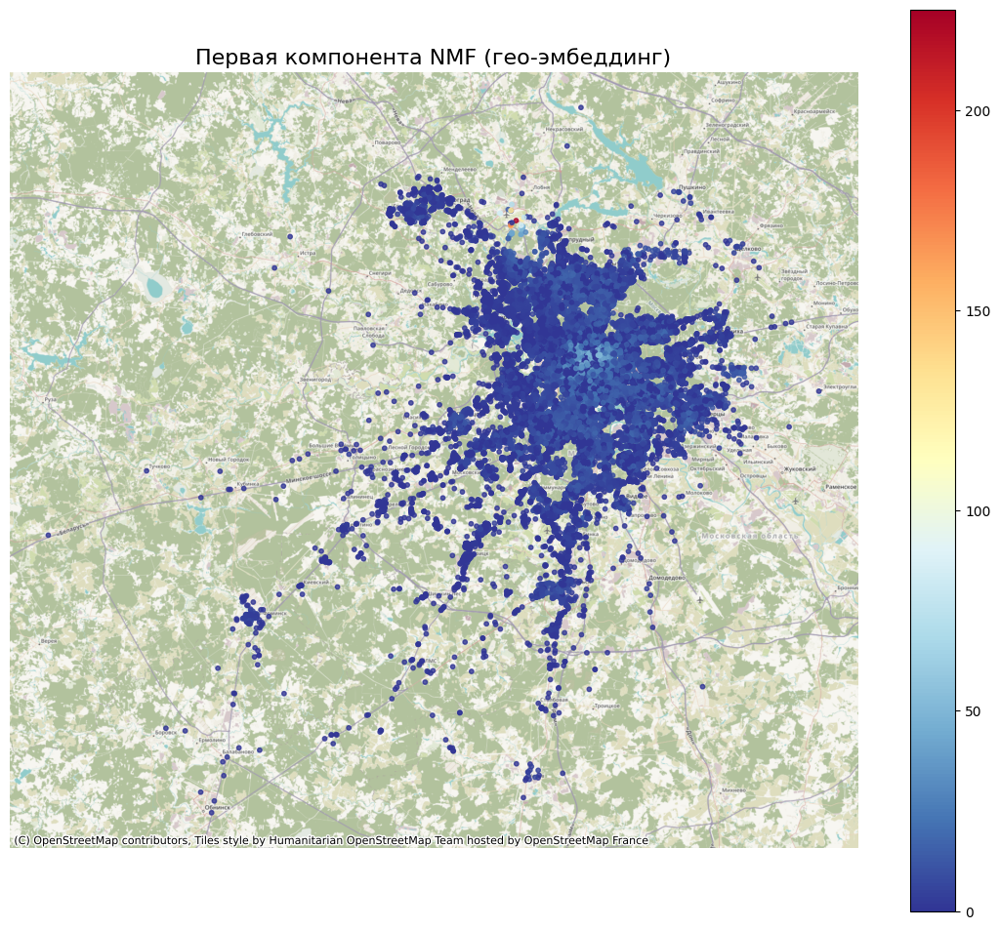

In [ ]:
# Предположим, у тебя уже есть X_nmf = NMF(...).fit_transform(X_geo)
# Возьмём первую компоненту
df_train['nmf_component_0'] = X_nmf[:, 0]

# Создаём GeoDataFrame (как выше)
geometry = [Point(xy) for xy in zip(df_train['longitude'], df_train['latitude'])]
gdf = gpd.GeoDataFrame(df_train, geometry=geometry, crs='EPSG:4326')
gdf = gdf.to_crs('EPSG:3857')

# Визуализация градиента
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

gdf.plot(
    column='nmf_component_0',
    cmap='RdYlBu_r',
    legend=True,
    markersize=10,
    alpha=0.8,
    ax=ax
)

try:
    ctx.add_basemap(ax, zoom=10)
except:
    pass

ax.set_axis_off()
plt.title('Первая компонента NMF (гео-эмбеддинг)', fontsize=16)
plt.show()

In [ ]:
X_nmf = X_nmf.merge(result_df, on='id', how='left').fillna(0)
X_test_nmf = X_test_nmf.merge(result_df, on='id', how='left').fillna(0)

AttributeError: 'numpy.ndarray' object has no attribute 'merge'

In [ ]:
from sklearn.preprocessing import StandardScaler

def scale_features(X_train, X_test, num_cols):
    for col in num_cols:
        scaler = StandardScaler()
        X_train[col] = scaler.fit_transform(X_train[col].values.reshape(-1, 1)).flatten()
        X_test[col] = scaler.transform(X_test[col].values.reshape(-1, 1)).flatten()
    return X_train, X_test

X_scaled, X_test_scaled = scale_features(X, X_test, num_cols)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=52)

## LGBM

In [ ]:
import lightgbm as lgb

# Создаём датасеты
data = lgb.Dataset(X, label=y)
train_data = lgb.Dataset(X_train, label=y_train)
val_data = lgb.Dataset(X_val, label=y_val, reference=train_data)

# Параметры модели
params = {
    'objective': 'regression',
    'metric': 'mae',              # метрика для оценки и минимизации
    'boosting_type': 'gbdt',
    'learning_rate': 0.03,
    'verbose': -1,
    'device': 'gpu'
}

# Обучение
cv_results = lgb.cv(
    params,
    data,
    num_boost_round=1000,
    nfold=5,  # 5 фолдов
    stratified=False,  # для регрессии обычно False
    shuffle=True,      # перемешиваем перед делением
    callbacks=[lgb.early_stopping(stopping_rounds=50)],
    eval_train_metric=True  # считаем метрику и на обучении тоже
)

In [ ]:
model = lgb.train(
    params,
    data,
    valid_sets=[val_data],
    num_boost_round=1000,
    callbacks=[lgb.log_evaluation(period=100)]
)

## CatBoost

In [ ]:
!pip install catboost -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 4.5 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

# 2. Простая модель с защитой от переобучения
model = CatBoostRegressor(
    n_estimators=800,           # Много деревьев, но ранняя остановка
    learning_rate=0.025,
    max_depth=7,             # Не слишком много листьев
    eval_metric='MAE',
    early_stopping_rounds=100,
    verbose=100,
    # task_type='GPU',
    # use_best_model=True
)

# 3. Обучение с ранней остановкой
model.fit(X_nmf, y)

0:	learn: 0.3208434	total: 640ms	remaining: 8m 31s


KeyboardInterrupt: 

## XGBoost

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)

In [ ]:
X_train_xgb = X_train.copy()
X_val_xgb = X_val.copy()
X_test_xgb = X_test.copy()

xgb_columns = X_train_xgb.columns.str.replace(r'[^a-zA-Z0-9]', '_', regex=True)
X_train_xgb.columns = xgb_columns
X_val_xgb.columns = xgb_columns
X_test_xgb.columns = xgb_columns

In [ ]:
from xgboost import XGBRegressor

model_xgb = XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=7,
    early_stopping_rounds=50,
    eval_metric='mae'
)

model_xgb.fit(
    X_train_xgb.values,  # ← .values вместо DataFrame
    y_train,
    eval_set=[(X_val_xgb.values, y_val)],
    verbose=100
)

## AutoML

In [ ]:
train_data = X.copy()
train_data.columns = xgb_columns
train_data['target'] = y
# val_data = X_val_xgb.copy()
# val_data['target'] = y_val

test_data = X_test_xgb.copy()

### H2O AutoML

In [ ]:
# !pip install h2o -U

import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,16 mins 20 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.8
H2O_cluster_version_age:,8 days
H2O_cluster_name:,H2O_from_python_unknownUser_kjd4xn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6.971 Gb
H2O_cluster_total_cores:,4
H2O_cluster_allowed_cores:,4
H2O_cluster_status:,"locked, healthy"


In [ ]:
train_hf = h2o.H2OFrame(train_data)
# val_hf = h2o.H2OFrame(val_data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
from h2o.automl import H2OAutoML

# Настройки
aml = H2OAutoML(
    # seed=42,
    # exclude_algos=["DeepLearning"],  # Опционально: исключить медленные модели
    verbosity="info",            # Показывать прогресс
    sort_metric="mean_absolute_error"
)

# Обучение
aml.train(
    y='target',                   # имя целевой колонки
    training_frame=train_hf
    # validation_frame=val_hf    # опционально, если есть валидация
)

AutoML progress: |
18:15:37.974: Project: AutoML_2_20251016_181537
18:15:37.975: 5-fold cross-validation will be used.
18:15:37.975: User didn't set any runtime constraints (max runtime or max models), using default 1h time limit
18:15:37.975: Setting stopping tolerance adaptively based on the training frame: 0.005748835619402825
18:15:37.975: Build control seed: -1 (random)
18:15:37.976: training frame: Frame key: AutoML_2_20251016_181537_training_Key_Frame__upload_82bb0ead069b4298d929e6523e654bd0.hex    cols: 339    rows: 30258  chunks: 49    size: 73212682  checksum: -7244836215416368572
18:15:37.976: validation frame: NULL
18:15:37.976: leaderboard frame: NULL
18:15:37.976: blending frame: NULL
18:15:37.976: response column: target
18:15:37.976: fold column: null
18:15:37.976: weights column: null
18:15:37.976: Loading execution steps: [{XGBoost : [def_2 (1g, 10w), def_1 (2g, 10w), def_3 (3g, 10w), grid_1 (4g, 90w), lr_search (6g, 30w)]}, {GLM : [def_1 (1g, 10w)]}, {DRF : [def_1 (2

In [ ]:
lb = aml.leaderboard
print(lb.head(rows=10))  # Топ-10 моделей

# Лучшая модель (по метрике по умолчанию)
print("Лучшая модель:", aml.leader.model_id)

In [ ]:
test_hf = h2o.H2OFrame(test_data)
preds = aml.predict(test_hf).as_data_frame()

### Autogluon

In [ ]:
from autogluon.tabular import TabularPredictor

predictor = TabularPredictor(
    label='target',
    path='ag_models',
    problem_type='regression',
    eval_metric='mean_absolute_error'
)


predictor.fit(
    train_data=train_data,
    tuning_data=val_data,  # используем validation данные
    presets='best_quality'
)

# 4. Предсказание на тестовых данных
test_predictions = predictor.predict(X_test_xgb)

# 5. Результаты
leaderboard = predictor.leaderboard(silent=False)
print("Лучшие модели:")
print(leaderboard.head())

# Prediction

In [ ]:
y_test = model.predict(X_test)
y_pred_rounded = [round(x, 1) for x in y_test]

In [ ]:
# submit = pd.DataFrame({'id': df_test['id'], 'target': preds['predict'].values})
submit = pd.DataFrame({'id': df_test['id'], 'target': y_test})
submit.to_csv('ctb_submit_12.csv', index=False)

In [ ]:
import os
os.remove('/kaggle/working/ctb_submit_4.csv')

In [ ]:
submit

,id,target
0,21472,3.80000
1,9837,3.50000
2,41791,3.30000
3,18441,3.60000
4,49348,3.00000
...,...,...
9271,30097,2.70000
9272,21993,3.70000
9273,43919,4.00000
9274,46598,3.70000
